# 3D Tomography Experiments

In [37]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [38]:
import numpy as np
import matplotlib.pyplot as plt
import pmcx
from utils import add_ball_to_array, get_cw_data, region_to_mua, get_td_data, detweight

In [39]:
# 3D / interactive plots
from ipywidgets import interact, IntSlider
# import ipyvolume as ipv # bad doesn't work in this env

### medium geometry

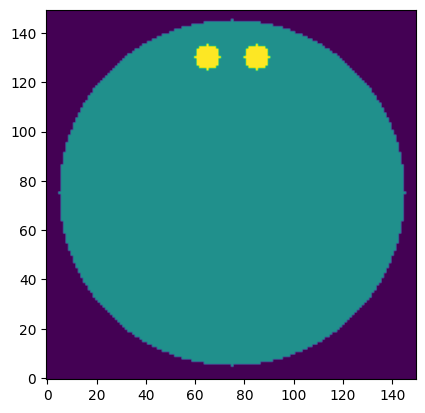

In [40]:
# number of voxels in each dimension
nx = 150
ny = 150
nz = 150 # 2d # whole thing becomes 3d if nz=150
r_head = 70 # head radius

# background
region = np.zeros((nz, ny, nx))

# head
region = add_ball_to_array(region, (nz//2, ny // 2, nx//2), r_head, 1)

# add balls
depth = 10 # mm (note this is the depth to the center of the ball)
separation = 10 # mm
r_ball = 5 # ball radius (mm)

region = add_ball_to_array(region, (nz//2, 130, nx//2 - np.floor(separation)), r_ball, 2)
region = add_ball_to_array(region, (nz//2, 130, nx//2 + np.ceil(separation)), r_ball, 2)

# def plot_slice(z,region):
#     plt.imshow(region[z, :, :],vmin=np.min(region), vmax=np.max(region))
#     plt.gca().invert_yaxis()
#     # plt.colorbar()
#     plt.show()

# interact(lambda z:plot_slice(z, region), z=IntSlider(min=0, max=nz-1, step=1, value=nz//2))


plt.imshow(region[nz//2])
plt.gca().invert_yaxis()
plt.show()


# Sensor Geometry

In [42]:
# Helper to convert spherical coordinates to cartesian coordinates
def spherical_to_cartesian(r, theta, phi):
    x = r * np.sin(theta) * np.cos(phi)
    y = r * np.sin(theta) * np.sin(phi)
    z = r * np.cos(theta)
    return x, y, z

# quick and dirty for placing optodes on sphere
# Place a few optodes on a sphere (noptodes = rootn**2, it's conveniant to pick a sqrt, like 4)
def sample_sphere(rootn = 4, # square-root of number of optodes to place
                  offset=False, nx=nx, ny=ny, nz=nz):
    # uniformly sample a part of the sphere
    PI=np.pi
    theta = np.linspace(PI/4,3*PI/4,rootn)
    phi = np.linspace(PI/4,3*PI/4,rootn) 
    if offset is True:
        theta += PI/2/(rootn*2)
        phi += PI/2/(rootn*2)
    thetas,phis = np.meshgrid(theta,phi)
    rs = np.ones(thetas.shape) * r_head
    x,y,z = spherical_to_cartesian(rs,thetas,phis)
    # re-center sphere
    x += nx/2
    y += ny/2
    z += nz/2
    x,y,z = x.flatten(),y.flatten(),z.flatten()
    positions = np.vstack([x,y,z]).T
    return positions 


In [43]:
import plotly.graph_objects as go
from skimage import measure

# Example 3D numpy array with a few layers (replace with your actual data)

# segment and plot sensors and sources
def plot_sensors3d(region, sensor_positions, source_positions):
    # Extract the isosurfaces for each layer
    verts1, faces1, _, _ = measure.marching_cubes(region.T, level=0.5, step_size=1) # head, this transpose is a bit hacky but I'm 85% sure it orients x,y,z correctly
    verts2, faces2, _, _ = measure.marching_cubes(region.T, level=1.5, step_size=1) # eyes
    # Sensor positions
    sensors_x = sensor_positions[:,2]
    sensors_y = sensor_positions[:,1]
    sensors_z = sensor_positions[:,0]
    # Source positions
    sources_x = source_positions[:,2]
    sources_y = source_positions[:,1]
    sources_z = source_positions[:,0]

    # Create a 3D scatter plot for the sensors
    sensors_scatter = go.Scatter3d(
        x=sensors_x,
        y=sensors_y,
        z=sensors_z,
        mode='markers',
        marker=dict(
            size=5,
            color='green',  # set color to green for sensors
            opacity=0.8
        ),
        name='Sensors'
    )
    
    # 3D scatter for the sources
    sources_scatter = go.Scatter3d(
        x=sources_x,
        y=sources_y,
        z=sources_z,
        mode='markers',
        marker=dict(
            size=5,
            color='red', # red for sources
            opacity=0.8
        ),
        name="Sources"
    )

    # Plot the isosurfaces extracted by marching cubes
    # mesh of head
    mesh1 = go.Mesh3d(
        x=verts1[:, 0],
        y=verts1[:, 1],
        z=verts1[:, 2],
        i=faces1[:, 0],
        j=faces1[:, 1],
        k=faces1[:, 2],
        opacity=0.25,
        color='blue',
        name='Layer 1'
    )
    # mesh of eyes
    mesh2 = go.Mesh3d(
        x=verts2[:, 0],
        y=verts2[:, 1],
        z=verts2[:, 2],
        i=faces2[:, 0],
        j=faces2[:, 1],
        k=faces2[:, 2],
        opacity=0.5,
        color='yellow',
        name='Layer 2'
    )

    # Combine everything into one figure
    fig = go.Figure(data=[sensors_scatter, sources_scatter, mesh1, mesh2])

    # Update the layout of the figure
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            xaxis=dict(nticks=10, gridcolor='white', gridwidth=1),
            yaxis=dict(nticks=10, gridcolor='white', gridwidth=1),
            zaxis=dict(nticks=10, gridcolor='white', gridwidth=1),
            aspectratio=dict(x=1, y=1, z=1)
        ),
        margin=dict(l=0, r=0, b=0, t=0),
        scene_camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.5)
        ),
    )

    # Show the figure
    fig.show()

sensor_positions = sample_sphere(3, offset=False)
sensor_positions = np.hstack([sensor_positions, np.array([np.ones(sensor_positions.shape[0])]).T]) # dogmatically add ones to that dim
source_positions = sample_sphere(3, offset=True)    
plot_sensors3d(region, sensor_positions, source_positions)


In [34]:
sensor_positions, source_positions

(array([[110.        , 110.        , 124.49747468,   1.        ],
        [124.49747468, 124.49747468,  75.        ,   1.        ],
        [110.        , 110.        ,  25.50252532,   1.        ],
        [ 75.        , 124.49747468, 124.49747468,   1.        ],
        [ 75.        , 145.        ,  75.        ,   1.        ],
        [ 75.        , 124.49747468,  25.50252532,   1.        ],
        [ 40.        , 110.        , 124.49747468,   1.        ],
        [ 25.50252532, 124.49747468,  75.        ,   1.        ],
        [ 40.        , 110.        ,  25.50252532,   1.        ]]),
 array([[105.31088913, 127.5       , 110.        ],
        [108.80740392, 133.55614126,  56.88266684],
        [ 92.5       , 105.31088913,  14.37822174],
        [ 59.30992924, 133.55614126, 110.        ],
        [ 57.5       , 140.31088913,  56.88266684],
        [ 65.94133342, 108.80740392,  14.37822174],
        [ 22.5       , 105.31088913, 110.        ],
        [ 16.44385874, 108.80740392,  56

### Optical properties

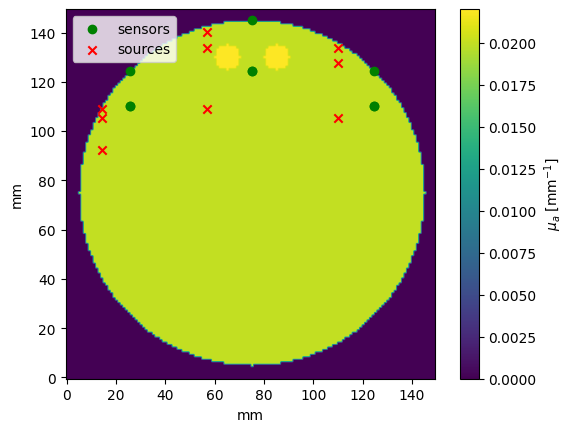

In [25]:
# noptodes = 10 # number of optodes (this equates to roughly 1cm spacing)
# sensor_positions = np.zeros((noptodes, 2))
# source_positions = np.zeros((noptodes, 2))

# # Create an array of i values
# i_values = np.arange(noptodes)

# # Calculate phi for q and m; phi = angles at which to place optodes on circle
# phi_sensors = i_values / noptodes * np.pi / 2 + np.pi / 4
# phi_sources = (i_values + 0.5) / noptodes * np.pi / 2 + np.pi / 4

# # Calculate sensor and source positions
# scaling_factor = 1

center_point = np.array([nz//2, ny // 2, nx // 2])
source_directions = center_point - source_positions
source_directions = source_directions / np.linalg.norm(source_directions, axis=1)[:,None] # normalize


# info about region
relative_change = 1.1

g = 0.9                    # anisotropy factor
mua0 = 0.02               # background absorption [1/mm]
mus0 = 0.67/(1-g)               # background scattering [1/mm]
mua1 = mua0 * relative_change # absorption of perturbation [1/mm]
mus1 = mus0 * relative_change # scattering of perturbation [1/mm]
refind = 1.4                # refractive index

optical_properties = np.array([
    [0,0,1,1],
    [mua0, mus0, g, refind],
    [mua1, mus1, g, refind]
    ])

mua = region_to_mua(region, optical_properties)

plt.figure()
plt.imshow(mua[nz//2,...])
plt.colorbar(label="$\\mu_a \\text{ }[\\text{mm}^{-1}]$")
plt.scatter(sensor_positions[:,-2], sensor_positions[:,-3], c='g', marker='o', label='sensors')
plt.scatter(source_positions[:,-1], source_positions[:,-2], c='r', marker='x', label='sources')
plt.gca().invert_yaxis()
plt.xlabel("mm"); plt.ylabel("mm")
plt.legend()
plt.show()

## Forward

In [26]:
def forward(volume, optical_properties, source_positions, source_directions, 
            detector_positions):
    """
    Implements the forward monte carlo solver.
    """

    config = {
        'nphoton': 1e7,
        'vol': volume,
        'tstart': 0,
        'tend': 1e-8,
        'tstep': 5e-10,
        'srcpos': source_positions,
        'srcdir': source_directions,
        'prop': optical_properties,
        'detpos': detector_positions,
        'replaydet':-1,
        'issavedet': 1,
        'issrcfrom0': 1,
        'issaveseed': 1,
        # 'unitinmm': 1.8,
        # 'maxdetphoton': 1e10,
    }

    result = pmcx.mcxlab(config)
    return result, config

def compute_jacobian(forward_result, config):
    config['seed']       = forward_result['seeds']  # one must define config['seed'] using the returned seeds
    config['detphotons'] = forward_result['detp']['data']   # one must define config['detphotons'] using the returned detp data
    config['outputtype'] = 'jacobian'               # tell mcx to output absorption (μ_a) Jacobian

    result = pmcx.run(config)
    return result, config

In [27]:
source_index = 3

optical_properties_bg = np.array([
    [0,0,1,1],
    [mua0, mus0, g, refind],
    [mua0, mus0, g, refind] # set perturbation to background
    ])

mua_bg = region_to_mua(region, optical_properties_bg)

res_bg, cfg_bg = forward(region, optical_properties_bg, source_positions[source_index], source_directions[source_index], sensor_positions)
res_true, cfg_true = forward(region, optical_properties, source_positions[source_index], source_directions[source_index], sensor_positions)

nphoton: 1e+07
tstart: 0
tstep: 5e-10
tend: 1e-08
issrcfrom0: 1
replaydet: -1
srcpos: [59.3099, 133.556, 110, 1]
srcdir: [0.224144, -0.836516, -0.5, 0]
issavedet: 1


issaveseed: 1
###############################################################################
#                      Monte Carlo eXtreme (MCX) -- CUDA                      #
#          Copyright (c) 2009-2023 Qianqian Fang <q.fang at neu.edu>          #
#                https://mcx.space/  &  https://neurojson.org/                #
#                                                                             #
# Computational Optics & Translational Imaging (COTI) Lab- http://fanglab.org #
#   Department of Bioengineering, Northeastern University, Boston, MA, USA    #
###############################################################################
#    The MCX Project is funded by the NIH/NIGMS under grant R01-GM114365      #
###############################################################################
#  Open-source codes and reusable scientific data are essential for research, #
# MCX proudly developed human-readable JSON-based data formats for easy reuse,#
#  Please consider using J

In [28]:
res_jac, cfg_jac = compute_jacobian(res_bg, cfg_bg)

nphoton: 1e+07
tstart: 0
tstep: 5e-10
tend: 1e-08
issrcfrom0: 1
replaydet: -1
srcpos: [59.3099, 133.556, 110, 1]
srcdir: [0.224144, -0.836516, -0.5, 0]
issavedet: 1


issaveseed: 1
###############################################################################
#                      Monte Carlo eXtreme (MCX) -- CUDA                      #
#          Copyright (c) 2009-2023 Qianqian Fang <q.fang at neu.edu>          #
#                https://mcx.space/  &  https://neurojson.org/                #
#                                                                             #
# Computational Optics & Translational Imaging (COTI) Lab- http://fanglab.org #
#   Department of Bioengineering, Northeastern University, Boston, MA, USA    #
###############################################################################
#    The MCX Project is funded by the NIH/NIGMS under grant R01-GM114365      #
###############################################################################
#  Open-source codes and reusable scientific data are essential for research, #
# MCX proudly developed human-readable JSON-based data formats for easy reuse,#
#  Please consider using J

In [29]:
J = res_jac['flux'] # Jacobian of shape (nz, ny, nx, nt, ndetectors)

# compare pertubation from Jacobian to the true pertubation
dmua = region_to_mua(region, optical_properties) - region_to_mua(region, optical_properties_bg)
dmua_reshaped = dmua[..., np.newaxis, np.newaxis]

dphi = -np.tensordot(J, dmua_reshaped, axes=([0,1,2], [0,1,2])) # beware negative sign
dphi = dphi.squeeze()

In [30]:
weights = detweight(res_bg['detp'], cfg_bg['prop'])

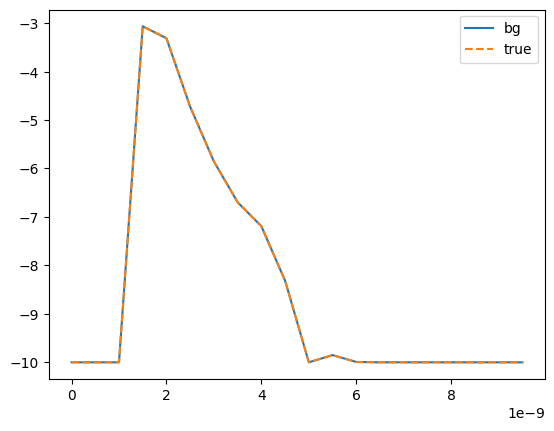

In [36]:
# # METHOD 1 for getting finite difference approximation
# intensity_bg = get_cw_data(res_bg, cfg_bg)
# intensity_true = get_cw_data(res_true, cfg_true)

# dphi_fd = (intensity_true - intensity_bg) / intensity_true

# METHOD 2 for getting finite difference approximation (using the same photons)
data_bg, t = get_td_data(res_bg, cfg_bg)
data_true, _ = get_td_data(res_bg, cfg_true)

cw_data_bg = np.sum(data_true, axis=0)[np.newaxis, :]
dphi_fd = (data_true - data_bg) / cw_data_bg

# intensity_bg = get_cw_data(res_bg, cfg_bg)
# intensity_true = get_cw_data(res_bg, cfg_true) # note we use res_bg here too

# dphi_fd = (intensity_true - intensity_bg) / intensity_true
# for i in range(noptodes):
plt.plot(t, np.log10(data_bg[:,0] + 1e-10),label="bg")
plt.plot(t, np.log10(data_true[:,0] + 1e-10),"--",label="true")
plt.legend()
plt.show()

## Inversion

In [33]:
from utils import invert
dmua = invert(dphi_fd, mua_bg, J)
mua_new = mua_bg + dmua

2023-11-19 04:27:53.239926: W external/tsl/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 11.62GiB (rounded to 12475220736)requested by op 
2023-11-19 04:27:53.240017: W external/tsl/tsl/framework/bfc_allocator.cc:497] ***************************************_____________________________________________________________
2023-11-19 04:27:53.240143: E external/xla/xla/pjrt/pjrt_stream_executor_client.cc:2716] Execution of replica 0 failed: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 12475220528 bytes.
BufferAssignment OOM Debugging.
BufferAssignment stats:
             parameter allocation:    2.26GiB
              constant allocation:         0B
        maybe_live_out allocation:   12.87MiB
     preallocated temp allocation:   11.62GiB
                 total allocation:   13.89GiB
Peak buffers:
	Buffer 1:
		Size: 7.09GiB
		Operator: op_name="jit(invert)/jit(main)/jit(<unnamed wrapped function>)/jit(svd)/svd[full_matrices=False

XlaRuntimeError: RESOURCE_EXHAUSTED: Out of memory while trying to allocate 12475220528 bytes.
BufferAssignment OOM Debugging.
BufferAssignment stats:
             parameter allocation:    2.26GiB
              constant allocation:         0B
        maybe_live_out allocation:   12.87MiB
     preallocated temp allocation:   11.62GiB
                 total allocation:   13.89GiB
Peak buffers:
	Buffer 1:
		Size: 7.09GiB
		Operator: op_name="jit(invert)/jit(main)/jit(<unnamed wrapped function>)/jit(svd)/svd[full_matrices=False compute_uv=True]" source_file="/home/steve/tomography-experiments/3d/utils.py" source_line=196
		XLA Label: custom-call
		Shape: f32[1903804896]
		==========================

	Buffer 2:
		Size: 2.26GiB
		Operator: op_name="jit(invert)/jit(main)/jit(<unnamed wrapped function>)/jit(svd)/svd[full_matrices=False compute_uv=True]" source_file="/home/steve/tomography-experiments/3d/utils.py" source_line=196
		XLA Label: custom-call
		Shape: f32[180,3375000]
		==========================

	Buffer 3:
		Size: 2.26GiB
		Operator: op_name="jit(invert)/jit(main)/neg" source_file="/home/steve/tomography-experiments/3d/utils.py" source_line=193
		XLA Label: fusion
		Shape: f32[180,3375000]
		==========================

	Buffer 4:
		Size: 2.26GiB
		Operator: op_name="jit(invert)/jit(main)/reshape[new_sizes=(3375000, 180) dimensions=None]" source_file="/home/steve/tomography-experiments/3d/utils.py" source_line=187
		Entry Parameter Subshape: f32[150,150,150,20,9]
		==========================

	Buffer 5:
		Size: 12.87MiB
		Operator: op_name="jit(invert)/jit(main)/jit(<unnamed wrapped function>)/dot_general[dimension_numbers=(((1,), (0,)), ((), ())) precision=(<Precision.HIGHEST: 2>, <Precision.HIGHEST: 2>) preferred_element_type=float32]" source_file="/home/steve/tomography-experiments/3d/utils.py" source_line=196
		XLA Label: fusion
		Shape: f32[3375000]
		==========================

	Buffer 6:
		Size: 720B
		Operator: op_name="jit(invert)/jit(main)/jit(<unnamed wrapped function>)/jit(svd)/svd[full_matrices=False compute_uv=True]" source_file="/home/steve/tomography-experiments/3d/utils.py" source_line=196
		XLA Label: custom-call
		Shape: f32[180]
		==========================

	Buffer 7:
		Size: 720B
		Entry Parameter Subshape: f32[20,9]
		==========================

	Buffer 8:
		Size: 48B
		Operator: op_name="jit(invert)/jit(main)/jit(<unnamed wrapped function>)/jit(svd)/svd[full_matrices=False compute_uv=True]" source_file="/home/steve/tomography-experiments/3d/utils.py" source_line=196
		XLA Label: custom-call
		Shape: (f32[180,3375000], f32[180], f32[180,3375000], f32[180,180], s32[], /*index=5*/f32[1903804896])
		==========================

	Buffer 9:
		Size: 4B
		Operator: op_name="jit(invert)/jit(main)/jit(<unnamed wrapped function>)/jit(svd)/svd[full_matrices=False compute_uv=True]" source_file="/home/steve/tomography-experiments/3d/utils.py" source_line=196
		XLA Label: custom-call
		Shape: s32[]
		==========================

	Buffer 10:
		Size: 4B
		XLA Label: parameter
		Shape: f32[]
		==========================

	Buffer 11:
		Size: 4B
		XLA Label: parameter
		Shape: f32[]
		==========================

	Buffer 12:
		Size: 4B
		XLA Label: add
		Shape: f32[]
		==========================



In [12]:
plt.imshow(dmua[nz//2,...])
plt.colorbar()
# flip y axis
plt.gca().invert_yaxis()

NameError: name 'dmua' is not defined

In [15]:
res_jac['flux'].shape # nz, ny, nx, nt, ndetectors

(1, 150, 150, 20, 10)

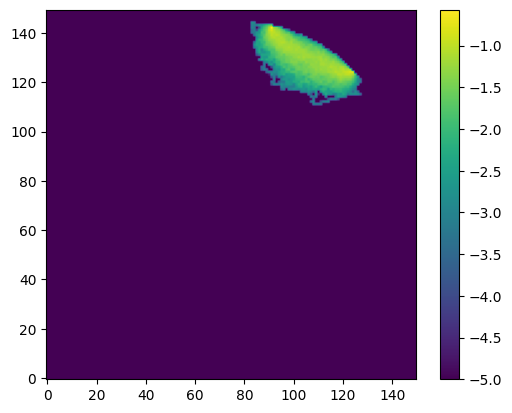

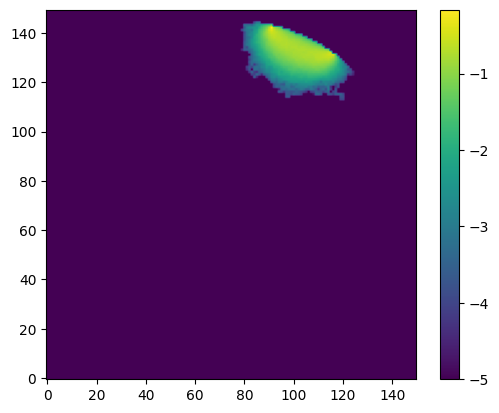

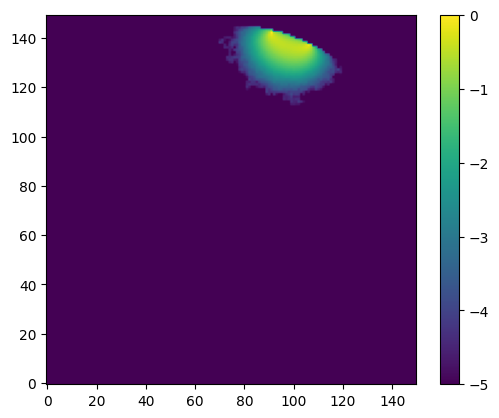

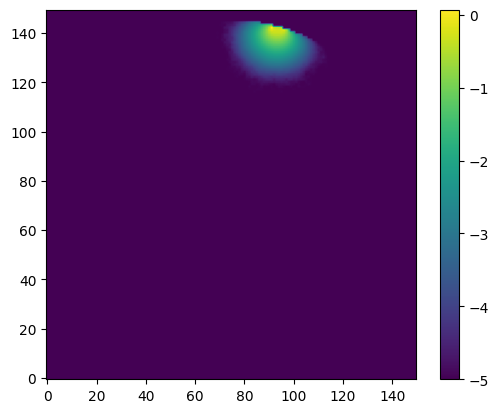

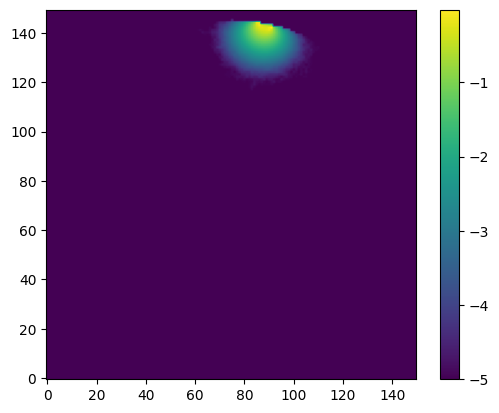

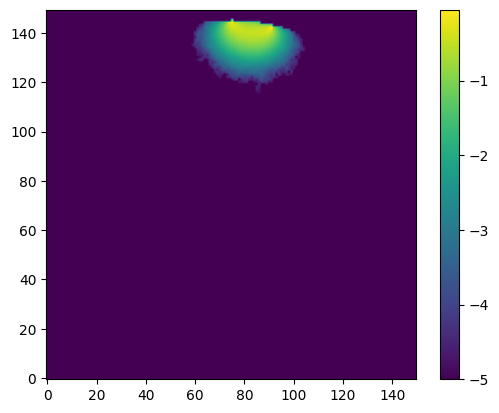

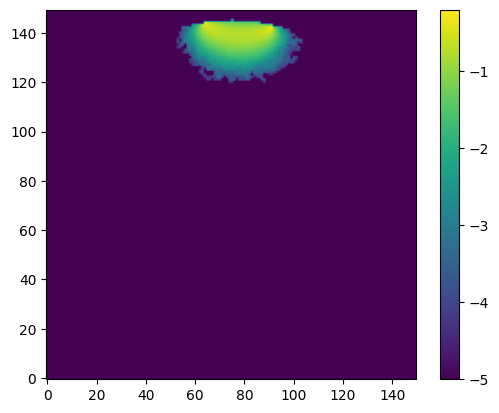

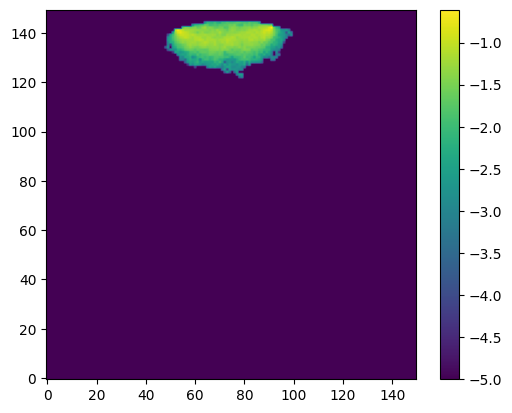

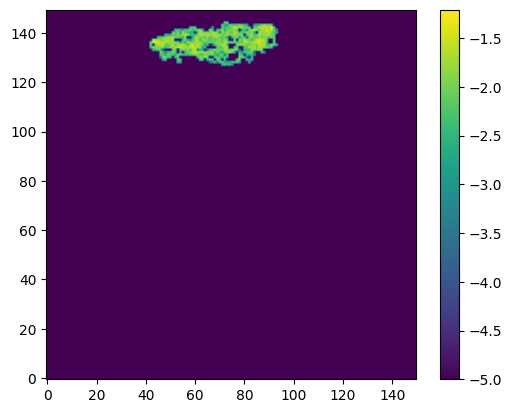

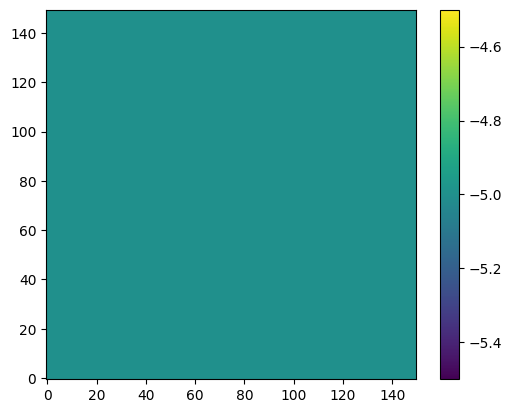

In [22]:
t=0
for detector_idx in range(10):
    plt.imshow((np.log10(res_jac['flux'][nz//2, :, :, t,detector_idx]+1e-5)))
    plt.gca().invert_yaxis()
    plt.colorbar()
    plt.show()